## Pricing European style options under the Black-Scholes model

#### AUTHORS: Nikhil Yuvraj (1903211)   ||   Mahendra Kumar (1903209)   ||   Ramdas Omkar Prasad (1903213)

## Importing libraries

In [1]:
from numpy import zeros, zeros_like, double, linspace, meshgrid, dot, exp, max, abs, append, sqrt, log
from scipy.stats import norm
from matplotlib import cm
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation, rc ## Needed for animation

## Parameter values and partitioning the domain:

In [2]:
K = 5.       # Strike price
sigma = 0.2  # volatility
r = 0.06     # risk-free interest rate
T = 1.       # Maturity date
xL = -2.
xR = 2.      # boundary of the spatial domain


Nx = 16 
x = linspace(xL,xR,Nx+1)   # mesh points in space direction
x=x.reshape(-1,1)
h = (xR - xL)/(Nx)


Nt = 8
t = linspace(0,T,Nt+1) # mesh points in temporal direction
t = t.reshape(-1, 1)
k = T/Nt


## Computing the solution matrix $U$

In [3]:
U = zeros((len(x),len(t)))
y = exp(x)-1.
Y = append(arr=zeros((len(y),1)),values=y,axis=1)    #Adding column of 1 to the matrix
U[:,0] = K*max(Y,axis=1)
U[0,:] = 0
U[-1,:] = K*(exp(x[-1])-1)


# -------------------------------------------------------------------------------------

# Thomas Algorithm

def ThomasMethod(a,b,c,d):

    x = zeros((len(d),1))
    M = len(x)-1

    # Modify the first-row coefficients
    d[0] = d[0]/b[0] 
    b[0] = 1

    for m in range(1,M):
      temp = b[m] - a[m] * c[m-1]
      a[m] = 0 
      b[m] = 1
      c[m] = c[m] / temp
      d[m] = (d[m] - a[m] * d[m-1]) / temp

    # print(b[M],a[M],d[M])
    d[M] = (d[M] - a[M] * d[M-1]) / ( b[M] - a[M] * c[M-1])
    a[M] = 0 
    b[M] = 1 

    # Back-substitution
    x[M] = d[M]
    for m in range(M-1,-1,-1): 
        x[m] = d[m] - c[m]*x[m+1]

    return x
  
#--------------------------------------------------------------------------------


#Solve the system using Thomas Algorithm

subdiag = zeros((len(x),1)) 
diag = zeros((len(x),1))
supdiag = zeros((len(x),1))
RHS = zeros(((len(x)),1)) #RHS : Right hand Side of system of equation


# -------------------------------------------------------------------

# Find solution U_j^{2} using U_j{1}

#Coefficients for diagonal elements in coefficient matrix
a = -(sigma**2)/(2*h**2) - (sigma**2)/(4*h) + r/(2*h) 
b = 1.0/k + (sigma**2)/(h**2) + r 
c = (sigma**2)/(4*h)  - (sigma**2)/(2*h**2) - r/(2*h)

#forming diagonal,sub-diagonal,super-diagonal arrays
for j in range(1,len(x)-1):
    subdiag[j] = a
    diag[j] = b
    supdiag[j] = c 
    RHS[j] = (1.0/k)*U[j,0] 
RHS[Nx] =  K*(exp(xR)-1)

# set entries outside the squre matrix as zero as they will not be used 
subdiag[0] = subdiag[-1] = supdiag[0] = supdiag[-1] = 0 
diag[0] = diag[-1] = 1.0                                 # since U_1^{n} = 0 for each n = 1,2, ... Nt+1 

U[:,1] = ThomasMethod(subdiag,diag,supdiag,RHS).reshape(-1,) #assigning the column entries for 2nd column in U


# --------------------------------------------------------------------------------------

# Find solution U_j^{n} using U_j^{n-1}  and U_j^{n-2}  for  n=3,4,...,Nt+1

#coefficients for diagonal elements in coefficient matrix
a = -(sigma**2)/(2*h**2) - (sigma**2)/(4*h) + r/(2*h)
b = 3.0/(2*k) + (sigma**2)/(h**2) + r 
c = (sigma**2)/(4*h)  - (sigma**2)/(2*h**2) - r/(2*h)

for j in range(1,len(x)-1):
    subdiag[j] = a
    diag[j] = b
    supdiag[j] = c 

# set entries outside the squre matrix as zero as they will not be used 
subdiag[0] = subdiag[-1] = supdiag[0] = supdiag[-1] = 0 

for n in range(2,Nt+1) : 
  for j in range(1,len(x)-1):
    RHS[j] = (1./(2*k)) * (4*U[j,n-1]  - U[j,n-2]) 
  RHS[Nx] =  K*(exp(xR)-1)
  diag[-1] = 1
  U[:,n] = ThomasMethod(subdiag,diag,supdiag,RHS).reshape(-1,) #assigning the values of columns after calculating in U

# ---------------------------------------------------------------------------------------






## Compute the solution $V_{num}(S,\tau)=:U(x,t)$ in original financial variables $S=Ke^{x}$ and $\tau = T-t$:

In [4]:
S = K*exp(x)
tau = T-t[::-1] # Original financial variables
Vnum = U[:,::-1]

## Plotting the Computed solution

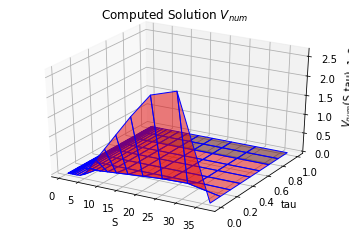

In [5]:
plt.clf() # clear existing figures
Tt, Ss = meshgrid(tau, S)
fig = plt.figure(1)
ax = plt.axes(projection='3d')
ax.plot_surface(Ss, Tt, Vnum, color='red',alpha = 0.5, linewidth=1, edgecolors='blue')
plt.axis('tight')
ax.set_xlabel('S')
ax.set_ylabel('tau')
ax.set_zlabel('$V_{num}$(S,tau)');
ax.set_title('Computed Solution $V_{num}$');


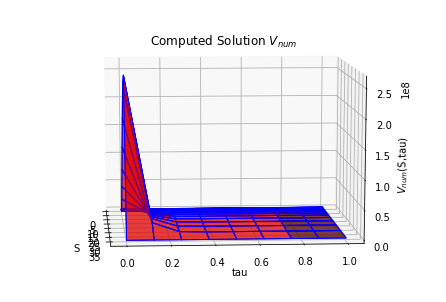

In [6]:
# Create a figure and a 3D Axes
fig = plt.figure()
ax = Axes3D(fig)
# init function initializes the data
def init():
    # Plot the surface.
    ax.plot_surface(Ss, Tt, Vnum, color='red',alpha = 0.5,
                    linewidth=1, edgecolors='blue')
    plt.axis('tight')
    ax.set_xlabel('S')
    ax.set_ylabel('tau')
    ax.set_zlabel('$V_{num}$(S,tau)');
    ax.set_title('Computed Solution $V_{num}$');
    return fig,

def animate(i):
    # azimuth angle : 0 deg to 360 deg
    ax.view_init(elev=10, azim=i*4)
    return fig,

# Animate
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=90, interval=50, blit = False) 
# The blit parameter ensures that only those pieces of the plot are re-drawn which have been changed
# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim

## Analytical Solution $V(S_{\tau},\tau)\;(S_{\tau},\tau)\in[Ke^{x_{L}},Ke^{x_{R}}]\times [0,T]$

In [7]:
V = zeros((len(S),len(tau))) # Initialization of the option value
y = S-K
Y = append(arr=zeros((len(y),1)),values=y,axis=1) #Adding column of 1 to the matrix
V[:,-1] = max(Y,axis=1) # Option value at the maturity date T
## option value at (S(i),tau(n)), i =1,2,...,Nx+1, n = 1,2,...,Nt.
for i in range(0,len(x)):
    for n in range(len(t)-2,-1,-1): 
        d1 = (log(S[i]/K) + (r+0.5*sigma**2)*(T-tau[n]))/(sigma*sqrt(T-tau[n]))
        d2 = d1-sigma*sqrt(T-tau[n])
        # V[i,n] = norm.cdf(d1)- K*exp(-r*(T-tau[n]))*norm.cdf(d2)
        V[i,n] = S[i]*norm.cdf(d1) - K*exp(-r*(T-tau[n]))*norm.cdf(d2)


## Plotting the Analytical solution

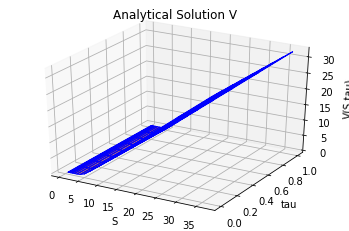

In [8]:
plt.clf() # clear existing figures
Tt, Ss = meshgrid(tau, S)
fig = plt.figure(1)
ax = plt.axes(projection='3d')
ax.plot_surface(Ss, Tt, V, color='red',alpha = 0.5, linewidth=1, edgecolors='blue')
plt.axis('tight')
ax.set_xlabel('S')
ax.set_ylabel('tau')
ax.set_zlabel('V(S,tau)');
ax.set_title('Analytical Solution V');

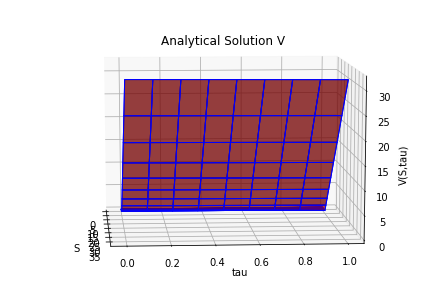

In [9]:
# Create a figure and a 3D Axes
fig = plt.figure()
ax = Axes3D(fig)
# init function initializes the data
def init():
    # Plot the surface.
    ax.plot_surface(Ss, Tt, V, color='red',alpha = 0.5,
                    linewidth=1, edgecolors='blue')
    plt.axis('tight')
    ax.set_xlabel('S')
    ax.set_ylabel('tau')
    ax.set_zlabel('V(S,tau)');
    ax.set_title('Analytical Solution V');
    return fig,

def animate(i):
    # azimuth angle : 0 deg to 360 deg
    ax.view_init(elev=10, azim=i*4)
    return fig,

# Animate
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=90, interval=50, blit = False) 
# The blit parameter ensures that only those pieces of the plot are re-drawn which have been changed
# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim